In [112]:
import pandas as pd
import matplotlib.pyplot as plt

In [113]:
import pandas as pd
import matplotlib.pyplot as plt

In [155]:
data = pd.read_csv('../data_file/fix_holiday_feature_train.csv')

In [21]:
df = pd.read_csv('../data_file/8_22.csv')

In [156]:
data['date_time'] = pd.to_datetime(data['date_time'])
#data.loc[data['date_time'] >= '2022-06-20', 'temperature'] *= 1.05
# Extract just the date from the datetime column
data['date'] = data['date_time'].dt.date

# Group by date and calculate mean for temperature and power_consumption
# daily_means = data.groupby('date').agg({'temperature': 'mean', 'power_consumption': 'mean'}).reset_index()


In [157]:
def plot_temp(i,data):
    building_numbers = list(range(i*10+1, i*10 + 11))
    
    # Set up the figure for subplots
    fig, axes = plt.subplots(nrows=len(building_numbers), ncols=1, figsize=(14, 4*len(building_numbers)), sharex=True)
    
    for idx, building in enumerate(building_numbers):
        # Filter data for the current building
        building_data = data[data['building_number'] == building]
        building_data = building_data[building_data['holiday'] == 0]
        
        # Group by date and calculate mean for temperature and power_consumption for the current building
        building_daily_means = building_data.groupby('date').agg({'temperature': 'mean', 'power_consumption': 'mean'}).reset_index()
        
        # Plot temperature for the current building
        color = 'tab:blue'
        ax1 = axes[idx]
        ax1.set_ylabel(f'Building {building}\nMean Temperature (°C)', color=color)
        ax1.plot(building_daily_means['date'], building_daily_means['temperature'], color=color)
        ax1.tick_params(axis='y', labelcolor=color)
        
        # Create a second y-axis for power consumption for the current building
        ax2 = ax1.twinx()
        color = 'tab:red'
        ax2.set_ylabel('Mean Power Consumption', color=color)
        ax2.plot(building_daily_means['date'], building_daily_means['power_consumption'], color=color)
        ax2.tick_params(axis='y', labelcolor=color)
    
    # Title and show the plot
    plt.suptitle(f'Daily Mean Temperature and Power Consumption for Buildings {building_numbers[0]} to {building_numbers[-1]}', y=1.02, fontsize=16)
    fig.tight_layout()
    plt.show()

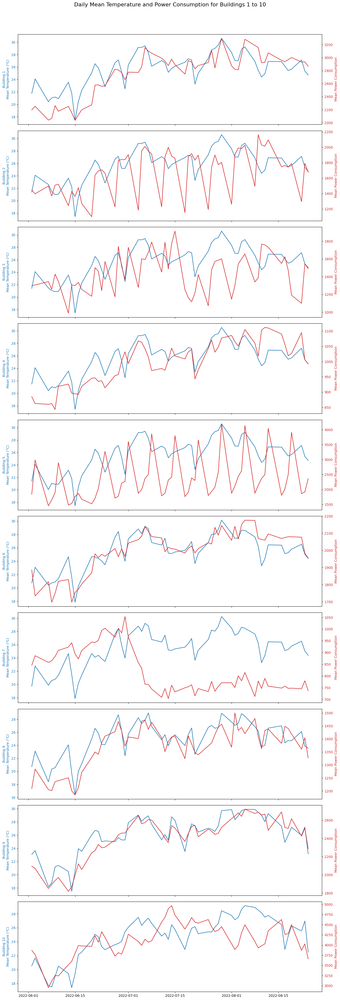

In [158]:
plot_temp(0,data)

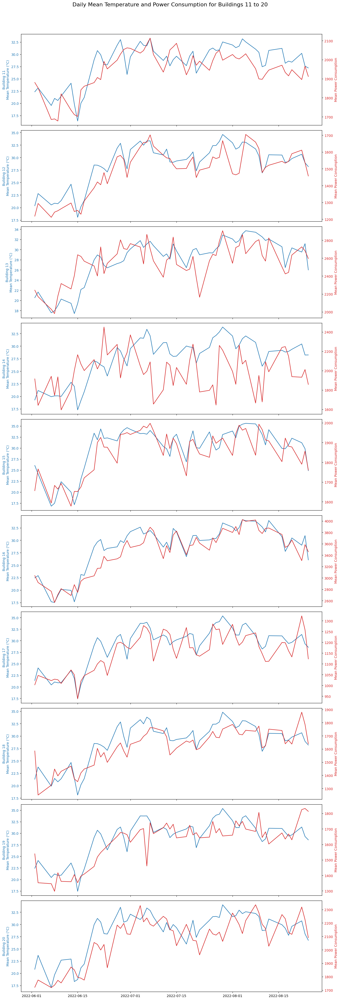

In [141]:
plot_temp(1, data)

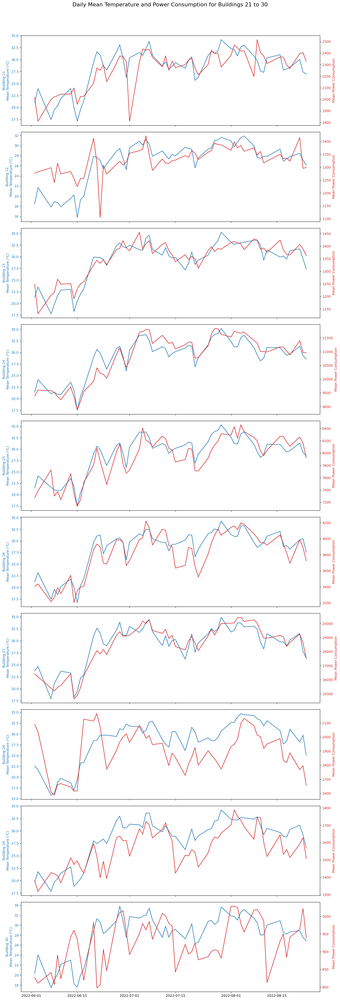

In [142]:
plot_temp(2,data)

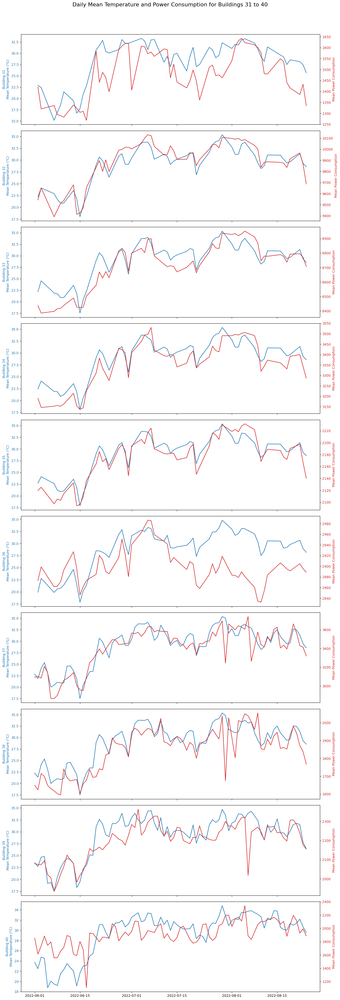

In [143]:
plot_temp(3,data)

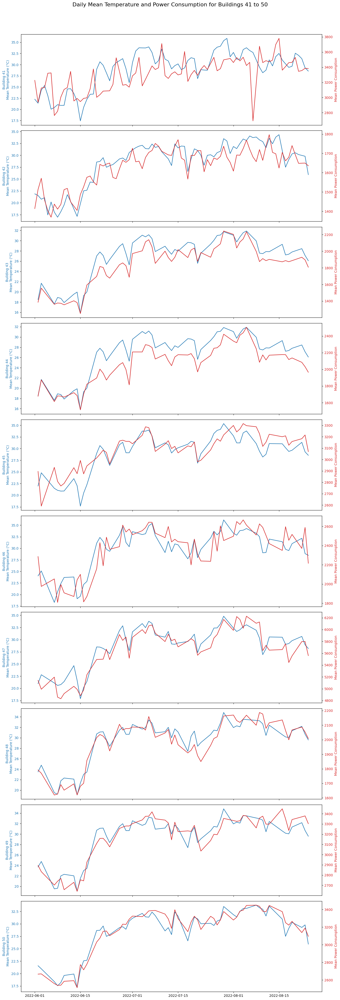

In [144]:
plot_temp(4,data)

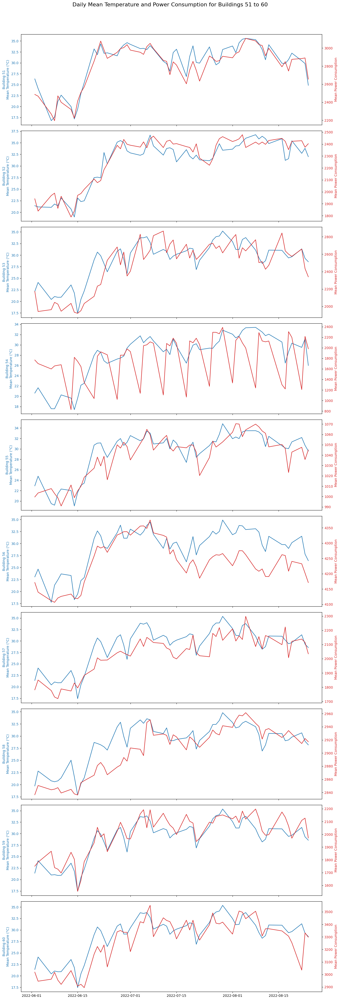

In [145]:
plot_temp(5,data)

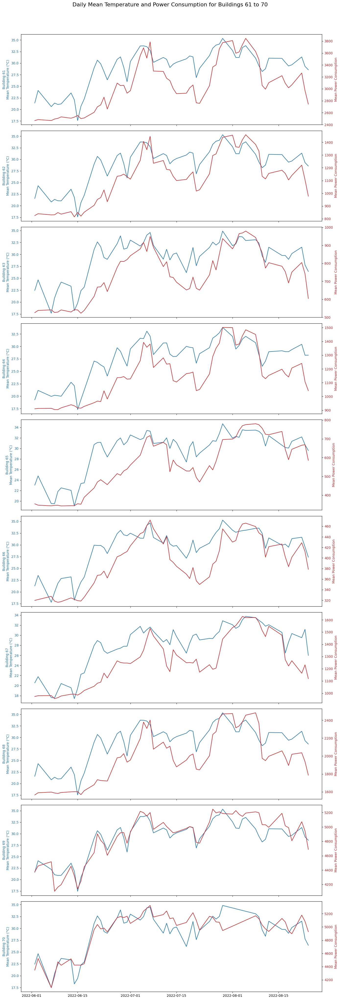

In [146]:
plot_temp(6,data)

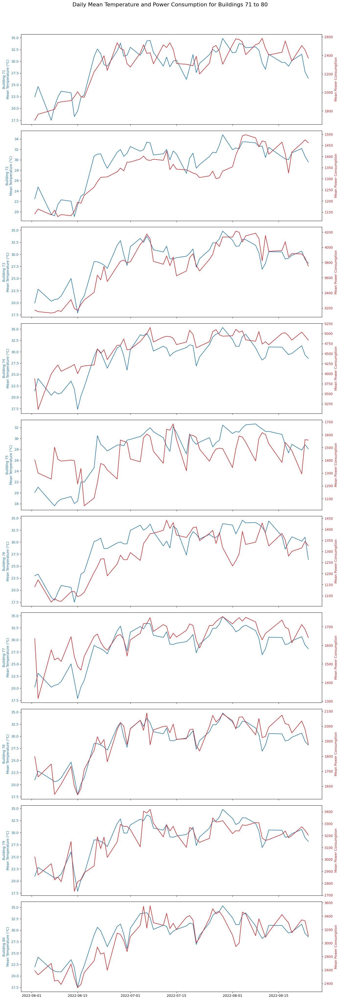

In [147]:
plot_temp(7,data)

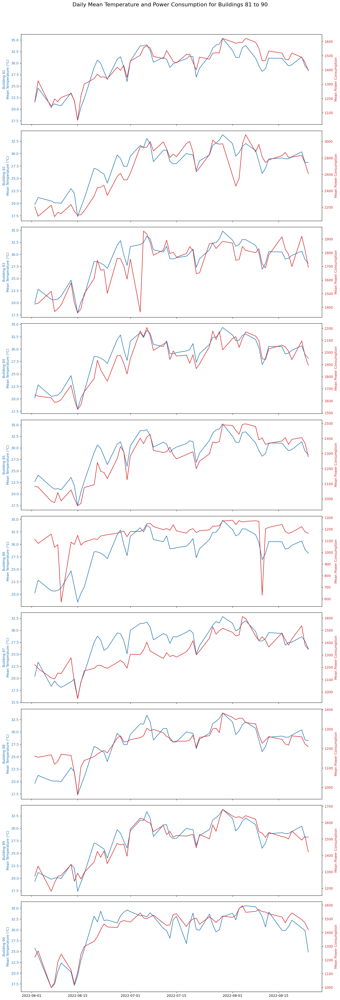

In [148]:
plot_temp(8,data)

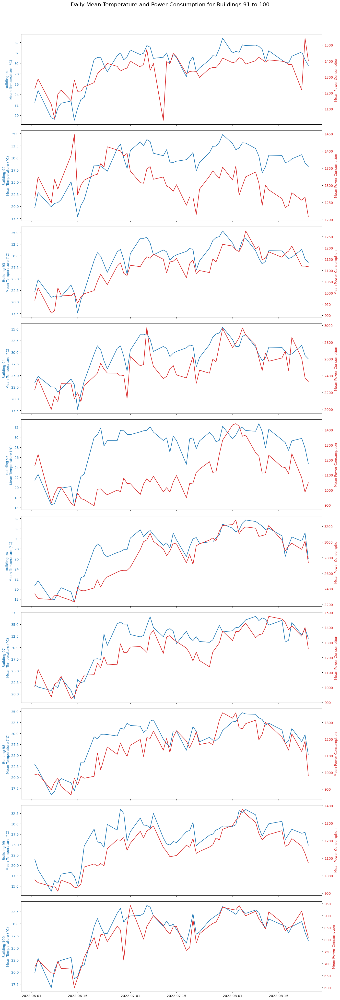

In [149]:
plot_temp(9,data)

In [111]:
# Extract building numbers from the 'num_date_time' column
df['building_num'] = df['num_date_time'].str.split('_').str[0]

# Check the unique building numbers
unique_buildings = df['building_num'].unique()
unique_buildings

NameError: name 'df' is not defined

In [ ]:
for building in unique_buildings:
    min_value = df[df['building_num'] == building]['answer'].min()
    df.loc[df['building_num'] == building, 'adjusted_answer'] = 1.03 * (df['answer'] - min_value) + min_value


In [ ]:
df

In [ ]:
df['answer'] = df['adjusted_answer']
df = df.drop(columns=['building_num', 'adjusted_answer'])

# Save the modified DataFrame to a new CSV file
output_file_path = '../data_file/8_22_2.csv'
df.to_csv(output_file_path, index=False)